In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import  matplotlib.pyplot as plt
from collections import Counter
from sklearn.model_selection import train_test_split
import numpy as np
from sklearn.metrics import f1_score

In [3]:
%matplotlib inline

# Introduction

Financial information is being threatened by increasingly more advanced technological methods, and thus more susceptible to cyberattacks. Banks like Wells Fargo, who are responsible for the safety of the financial information of their customers, would like to allocate financial and technological resources efficiently to help protect their customers from these financial attacks. 

We believe that the elder population -- defined as adults over 59 years of age-- is more susceptible to fraudulent financial abuse, but also less likely to report financial abuse due to lack of knowledge or barriers in technology. Hence, it is logical that a significant portion of the resources dedicated to protecting financial information should be used on elders. We would like to find the most efficient way to dedicate these resources to protecting the elder consumers. 

This report will be dedicated to finding the optimal classification method that best identifies fraudulent transactions amongst elder customers. We will pay special attention to minimizing the Type 2 error, which is a false negative; in this case, a false negative would be a fraudulent transaction that went unreported. Minimizing the false negative is the most important criteria in our classification model, and thus we will pay special attention to this metric.


# Datasets & Pre-Processing

In [45]:
dataset = pd.read_csv("wells_fargo_trainset.csv")

In [46]:
dataset= pd.get_dummies(dataset, columns=['FRAUD_NONFRAUD'])

dataset.rename(columns = {"FRAUD_NONFRAUD_Fraud": "Fraud"},inplace=True)

dataset.drop(["FRAUD_NONFRAUD_Non-Fraud"],axis=1,inplace=True)

In [11]:
dataset.describe()

,TRAN_AMT,ACCT_PRE_TRAN_AVAIL_BAL,CUST_AGE,OPEN_ACCT_CT,WF_dvc_age,CUST_ZIP,Fraud
count,14000.000000,14000.000000,14000.000000,14000.000000,14000.000000,14000.000000,14000.000000
mean,275.377747,10233.110609,53.937214,6.666714,611.061571,74007.681071,0.297429
std,317.892333,29967.453812,18.829836,9.059419,668.113489,24948.053588,0.457143
min,0.010000,0.000000,13.000000,0.000000,-117.000000,0.000000,0.000000
25%,11.322500,0.000000,39.000000,3.000000,75.000000,63123.000000,0.000000
50%,161.355000,2410.395000,59.000000,5.000000,365.500000,85037.000000,0.000000
75%,488.822500,4732.695000,68.000000,7.000000,961.000000,92201.000000,1.000000
max,2376.060000,361519.050000,105.000000,227.000000,2783.000000,99835.000000,1.000000


In [47]:
dataset["Elder"] = 1
dataset.loc[dataset["CUST_AGE"]<=59,"Elder"]=0

In [13]:
Counter(dataset["Elder"])

Counter({0: 7080, 1: 6920})

In [14]:
Counter(dataset["Fraud"])

Counter({0: 9836, 1: 4164})

<AxesSubplot:xlabel='Elder', ylabel='count'>

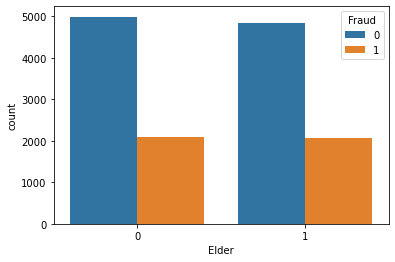

In [15]:
sns.countplot(x="Elder",data=dataset,hue="Fraud")


In [48]:
dataset['CUST_STATE']=dataset['CUST_STATE'].astype(str)

In [18]:
dataset.isnull().sum()

TRAN_AMT                      0
ACCT_PRE_TRAN_AVAIL_BAL       0
CUST_AGE                      0
OPEN_ACCT_CT                  0
WF_dvc_age                    0
PWD_UPDT_TS                3125
CARR_NAME                  2709
RGN_NAME                   2709
STATE_PRVNC_TXT            2709
ALERT_TRGR_CD                 0
DVC_TYPE_TXT               1761
AUTHC_PRIM_TYPE_CD            0
AUTHC_SCNDRY_STAT_TXT        74
CUST_ZIP                      0
CUST_STATE                   36
PH_NUM_UPDT_TS             7061
CUST_SINCE_DT                 0
TRAN_TS                       0
TRAN_DT                       0
ACTN_CD                       0
ACTN_INTNL_TXT                0
TRAN_TYPE_CD                  0
ACTVY_DT                      0
Fraud                         0
Elder                         0
dtype: int64

In [49]:
# Transform "Resident State" & set up new feature "Different_State"
statename = ['ALABAMA',  'ALASKA',  'AMERICAN SAMOA',  'ARIZONA',  'ARKANSAS',  'CALIFORNIA',  'COLORADO',  'CONNECTICUT',  'DELAWARE',  'DISTRICT OF COLUMBIA',  'FLORIDA',  'GEORGIA',  'GUAM',  'HAWAII',  'IDAHO',  'ILLINOIS',  'INDIANA',  'IOWA',  'KANSAS',  'KENTUCKY',  'LOUISIANA',  'MAINE',  'MARYLAND',  'MASSACHUSETTS',  'MICHIGAN',  'MINNESOTA',  'MISSISSIPPI',  'MISSOURI',  'MONTANA',  'NEBRASKA',  'NEVADA',  'NEW HAMPSHIRE',  'NEW JERSEY',  'NEW MEXICO',  'NEW YORK',  'NORTH CAROLINA',  'NORTH DAKOTA',  'NORTHERN MARIANA IS',  'OHIO',  'OKLAHOMA',  'OREGON',  'PENNSYLVANIA',  'PUERTO RICO',  'RHODE ISLAND',  'SOUTH CAROLINA',  'SOUTH DAKOTA',  'TENNESSEE',  'TEXAS',  'UTAH',  'VERMONT',  'VIRGINIA',  'VIRGIN ISLANDS',  'WASHINGTON',  'WEST VIRGINIA',  'WISCONSIN',  'WYOMING']

statename = [x.lower() for x in statename]

stateabbrev = ['AL',  'AK',  'AS',  'AZ',  'AR',  'CA',  'CO',  'CT',  'DE',  'DC',  'FL',  'GA',  'GU',  'HI',  'ID',  'IL',  'IN',  'IA',  'KS',  'KY',  'LA',  'ME',  'MD',  'MA',  'MI',  'MN',  'MS',  'MO',  'MT',  'NE',  'NV',  'NH',  'NJ',  'NM',  'NY',  'NC',  'ND',  'MP',  'OH',  'OK',  'OR',  'PA',  'PR',  'RI',  'SC',  'SD',  'TN',  'TX',  'UT',  'VT',  'VA',  'VI',  'WA',  'WV',  'WI',  'WY']

state_abbrev_dict = dict(zip(statename,stateabbrev))

dataset["STATE_PRVNC_TXT_ABBREV"] = dataset["STATE_PRVNC_TXT"].map(state_abbrev_dict)

dataset["STATE_PRVNC_TXT"].unique()

Counter(dataset["STATE_PRVNC_TXT"])

dataset["Different_State"]=0

dataset.loc[dataset["STATE_PRVNC_TXT_ABBREV"]!=dataset["CUST_STATE"],"Different_State"]=1

In [50]:
custstate = dataset['CUST_STATE'].to_list()

custstate = [state if state in ["CA","TX","AZ","FL","NV"] else "Other_State" for state in custstate ]

dataset['major_state']=pd.Series(custstate)

dataset=dataset[~(dataset['CUST_STATE']=='nan')]

Text(0.5, 1.0, 'Missing Value distribution')

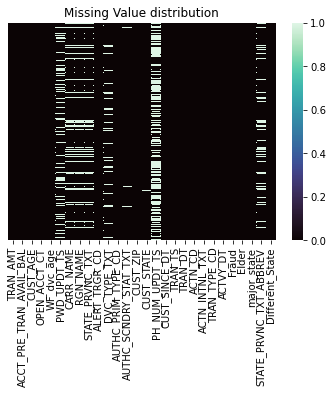

In [25]:
sns.heatmap(dataset.isna(),cmap='mako',xticklabels=True,yticklabels=False)
plt.title("Missing Value distribution")

<AxesSubplot:xlabel='major_state', ylabel='count'>

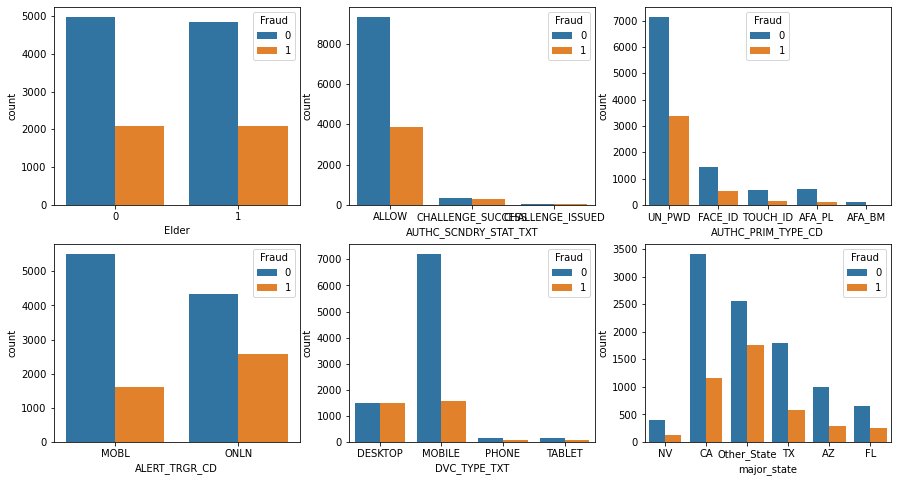

In [26]:
fig, axes = plt.subplots(2, 3, figsize=(15, 8), sharey=False)

sns.countplot(x="Elder",data=dataset,hue="Fraud",ax=axes[0][0])
sns.countplot(x="AUTHC_SCNDRY_STAT_TXT",data=dataset,hue="Fraud",ax=axes[0][1])
sns.countplot(x="AUTHC_PRIM_TYPE_CD",data=dataset,hue="Fraud",ax=axes[0][2])
sns.countplot(x="ALERT_TRGR_CD",data=dataset,hue="Fraud",ax=axes[1][0])
sns.countplot(x="DVC_TYPE_TXT",data=dataset,hue="Fraud",ax=axes[1][1])
sns.countplot(x="major_state",data=dataset,hue="Fraud",ax=axes[1][2])

The original dataset provides 14,000 samples with 4200 Fraud labels and 9800 Non Fraud Labels, as well as 22 features including basic information (such as age, resident state of customer), bank account record of customers (including Wells Fargo account age, password updating date, phone number updating date), transaction information (like transaction amount, transaction device, the state transaction occurred, carrier name derived from IP address of customer’s device, alert trigger code) and specific timestamp record(transaction timestamp, activity date). 

About half (6920) of the dataset is older customers (age > 59). For this specific project, we aim to classify fraud problems for those customers. But before analysis, we need to preprocess them before analysis since some features in the original dataset contain some missing values. 

<AxesSubplot:xlabel='CARR_NAME_Major', ylabel='count'>

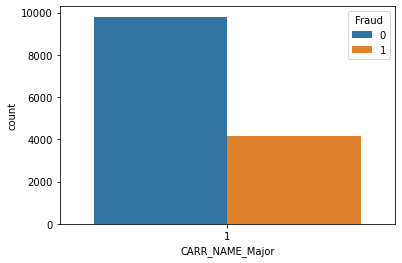

In [106]:
sns.countplot(x="CARR_NAME_Major",data=dataset,hue="Fraud")

<AxesSubplot:>

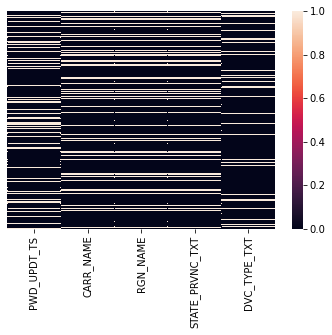

In [103]:
sns.heatmap(dataset[['PWD_UPDT_TS','CARR_NAME','RGN_NAME','STATE_PRVNC_TXT','DVC_TYPE_TXT']].isna(),yticklabels=False)

In [51]:
Marjor_CARR_NAME=dataset["CARR_NAME"].tolist()

CARR_NAME = dataset['CARR_NAME'].tolist()
CARR_NAME = [carr if carr in Marjor_CARR_NAME else "Other_CARR" for carr in CARR_NAME]

dataset['CARR_NAME_Major'] = pd.Series(CARR_NAME)
Counter(dataset['CARR_NAME_Major'])

dataset.loc[dataset['CARR_NAME_Major']!='Other_CARR','CARR_NAME_Major']=1
dataset.loc[dataset['CARR_NAME_Major']=='Other_CARR','CARR_NAME_Major']=0

dataset['CARR_NAME_Major']=dataset['CARR_NAME_Major'].astype(int)



We filled in PW_UPDT_TS, PH_NUM_UPDT_TS with the value of CUST_SINCE because we assumed that those customers with missing values never changed their password or phone number since the account was opened. For the remaining 36 samples holding missing values in all three of the aforementioned features, we removed them from the dataset completely.

Secondly, we have created new features from the dataset, such as PWD_UPD_DAYS (numbers of days since password updated), PH_NUM_UPDT_DAYS (number of days since phone number updated), and Different_State (whether customer's resident state different from the state where transaction occurred).

In [52]:
dataset["PWD_UPDT_TS"]=dataset[dataset["PWD_UPDT_TS"].notnull()]["PWD_UPDT_TS"].map(lambda x : x.split()[0])

dataset["TRAN_TS"]=dataset[dataset["TRAN_TS"].notnull()]["TRAN_TS"].map(lambda x : x.split()[0])

dataset["TRAN_DT"]=dataset[dataset["TRAN_DT"].notnull()]["TRAN_DT"].map(lambda x : x.split()[0])

dataset["PH_NUM_UPDT_TS"]=dataset[dataset["PH_NUM_UPDT_TS"].notnull()]["PH_NUM_UPDT_TS"].map(lambda x : x.split()[0])

dataset["CUST_SINCE_DT"]=dataset[dataset["CUST_SINCE_DT"].notnull()]["CUST_SINCE_DT"].map(lambda x : x.split()[0])

dataset["PWD_UPDT_TS"]=pd.to_datetime(dataset[dataset["PWD_UPDT_TS"].notnull()]["PWD_UPDT_TS"], infer_datetime_format=True,errors='coerce').dt.strftime('%Y-%m-%d')

dataset["TRAN_TS"]=pd.to_datetime(dataset[dataset["TRAN_TS"].notnull()]["TRAN_TS"], infer_datetime_format=True) 

dataset["TRAN_DT"]=pd.to_datetime(dataset[dataset["TRAN_DT"].notnull()]["TRAN_DT"], infer_datetime_format=True) 

dataset["PH_NUM_UPDT_TS"]=pd.to_datetime(dataset[dataset["PH_NUM_UPDT_TS"].notnull()]["PH_NUM_UPDT_TS"], infer_datetime_format=True,errors='coerce').dt.strftime('%Y-%m-%d') 

dataset["CUST_SINCE_DT"]=pd.to_datetime(dataset[dataset["CUST_SINCE_DT"].notnull()]["CUST_SINCE_DT"], infer_datetime_format=True) 

dataset[['PWD_UPDT_TS','PH_NUM_UPDT_TS','CUST_SINCE_DT','TRAN_DT']]

dataset.loc[dataset["PWD_UPDT_TS"].isna(),['PWD_UPDT_TS']]=dataset["CUST_SINCE_DT"]
dataset.loc[dataset["PH_NUM_UPDT_TS"].isna(),['PH_NUM_UPDT_TS']]=dataset["CUST_SINCE_DT"]

dataset[['PWD_UPDT_TS','PH_NUM_UPDT_TS','CUST_SINCE_DT','TRAN_DT']]=dataset[['PWD_UPDT_TS','PH_NUM_UPDT_TS','CUST_SINCE_DT','TRAN_DT']].astype('datetime64')

dataset["PWD_UPDT_DAYS"] = (pd.to_datetime(dataset["PWD_UPDT_TS"])-pd.to_datetime(dataset["CUST_SINCE_DT"])).dt.days
dataset["PH_HUM_UPDT_DAYS"] =(pd.to_datetime(dataset["PH_NUM_UPDT_TS"])-pd.to_datetime(dataset["CUST_SINCE_DT"])).dt.days


In [56]:
dataset.drop(["CARR_NAME","RGN_NAME","STATE_PRVNC_TXT","STATE_PRVNC_TXT_ABBREV"],axis=1,inplace=True)

In [57]:
dataset_dummies = pd.get_dummies(dataset, columns=['AUTHC_SCNDRY_STAT_TXT','ALERT_TRGR_CD','AUTHC_PRIM_TYPE_CD','DVC_TYPE_TXT', 'major_state'])

In [59]:
len(dataset_dummies)

13964

<AxesSubplot:>

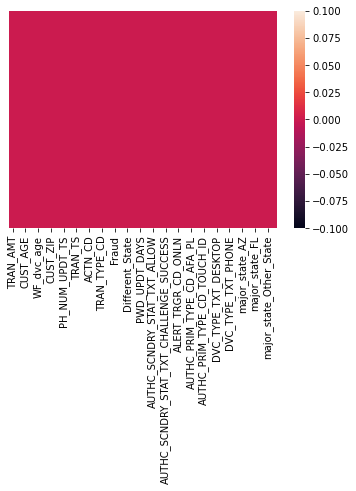

In [171]:
sns.heatmap(dataset_dummies.isna(),yticklabels=False)

In [60]:
dataset_dummies.to_csv("dataset_dummies.csv",index=False)

In [49]:
Counter(dataset[dataset["CUST_AGE"]>59]["Fraud"])

Counter({0: 4820, 1: 2076})

In [50]:
Counter(dataset[dataset["CUST_AGE"]<=59]["Fraud"])

Counter({0: 4980, 1: 2088})

C:\Users\Harmony Chen\anaconda3\lib\site-packages\seaborn\distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\Harmony Chen\anaconda3\lib\site-packages\seaborn\distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\Harmony Chen\anaconda3\lib\site-packages\seaborn\distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\Harmony Chen\anaconda3\lib\site-packages\seaborn\distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


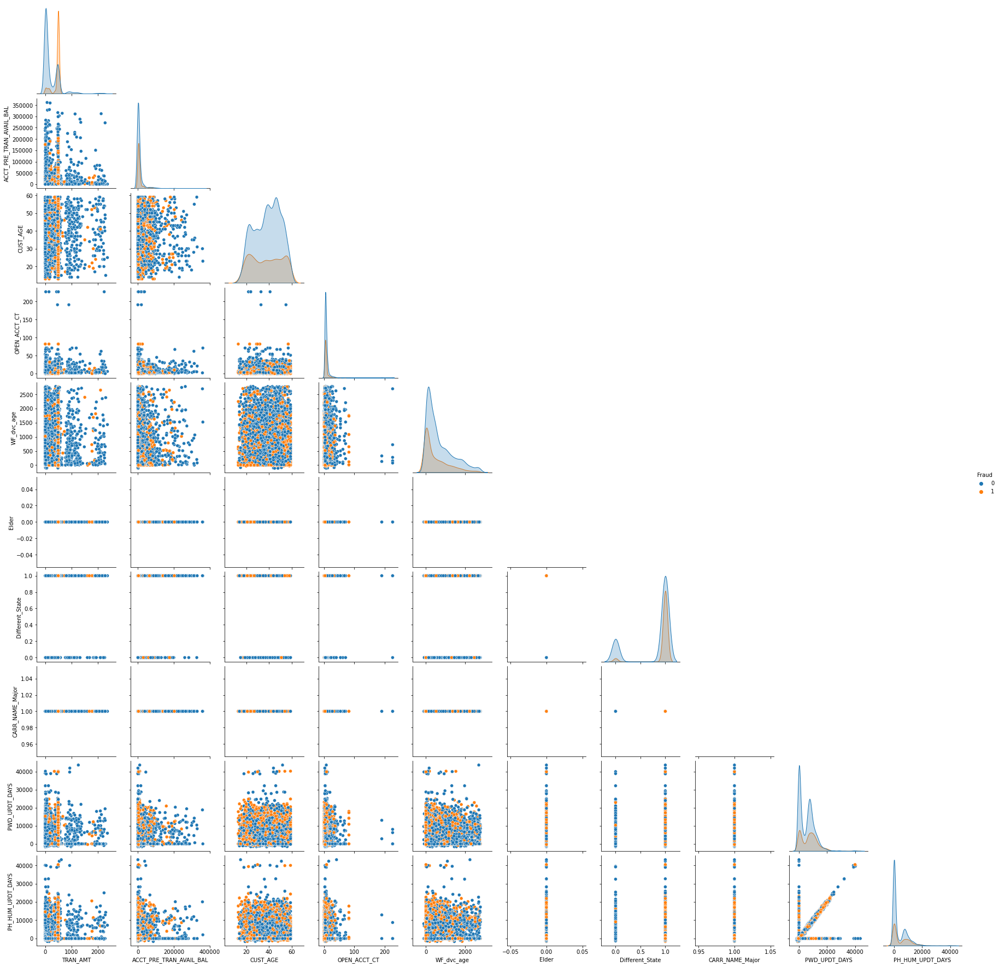

In [86]:
sns.pairplot(data=dataset[dataset["CUST_AGE"]<=59],hue="Fraud",corner=True)

C:\Users\Harmony Chen\anaconda3\lib\site-packages\seaborn\distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\Harmony Chen\anaconda3\lib\site-packages\seaborn\distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


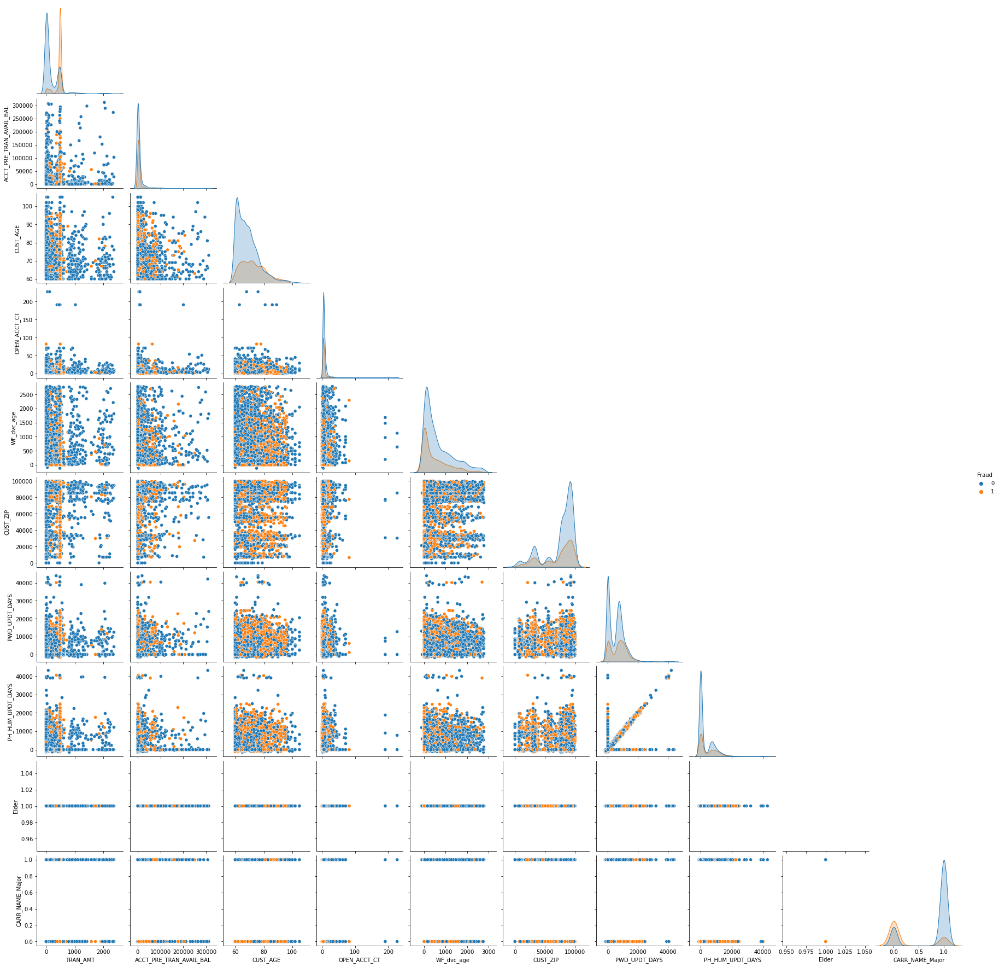

In [223]:
sns.pairplot(data=dataset[dataset["CUST_AGE"]>59],hue="Fraud",corner=True)

<AxesSubplot:>

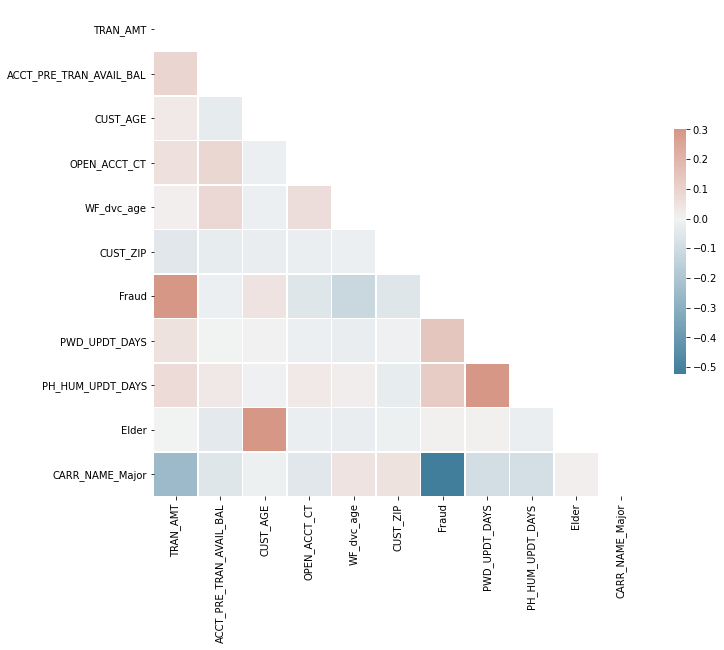

In [226]:
# Compute the correlation matrix
corr = dataset.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

<AxesSubplot:>

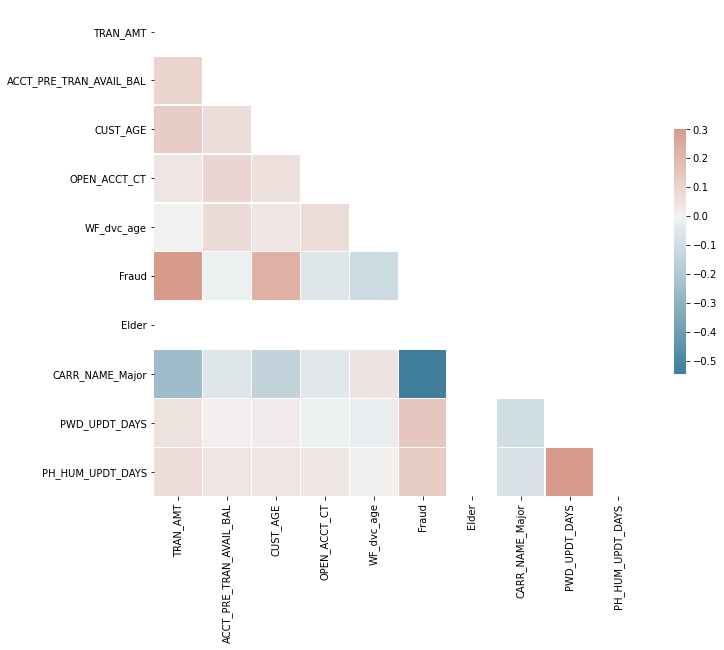

In [59]:
# Compute the correlation matrix
corr =dataset[dataset["Elder"]==1].corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

<AxesSubplot:>

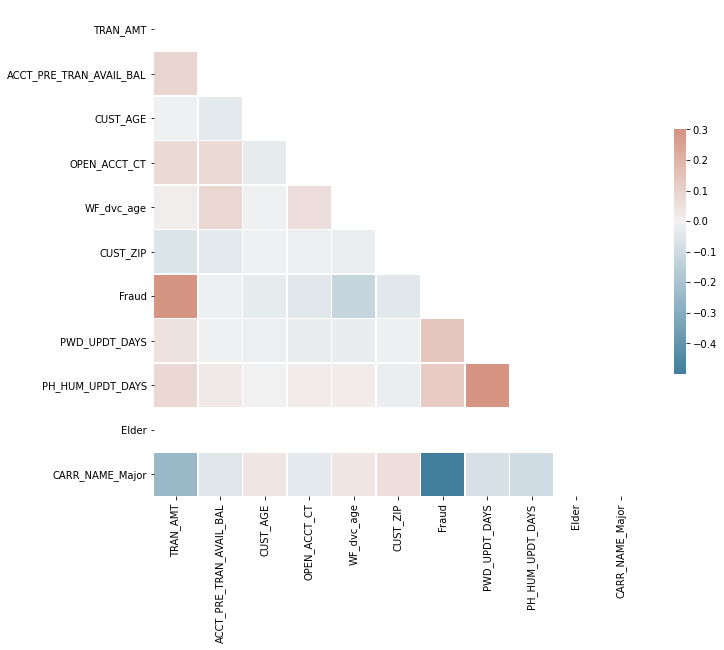

In [228]:
# Compute the correlation matrix
corr =dataset[dataset["Elder"]==0].corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

<AxesSubplot:>

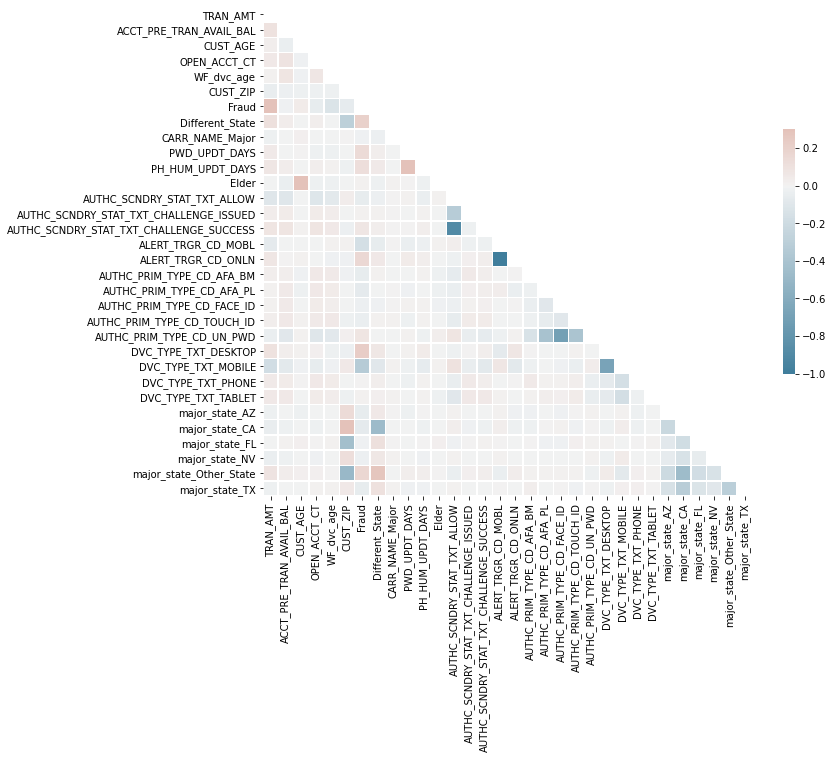

In [113]:
# Compute the correlation matrix
corr =dataset_dummies.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})


[Text(0.5, 1.0, 'Correlation of Fraud in Elder group')]

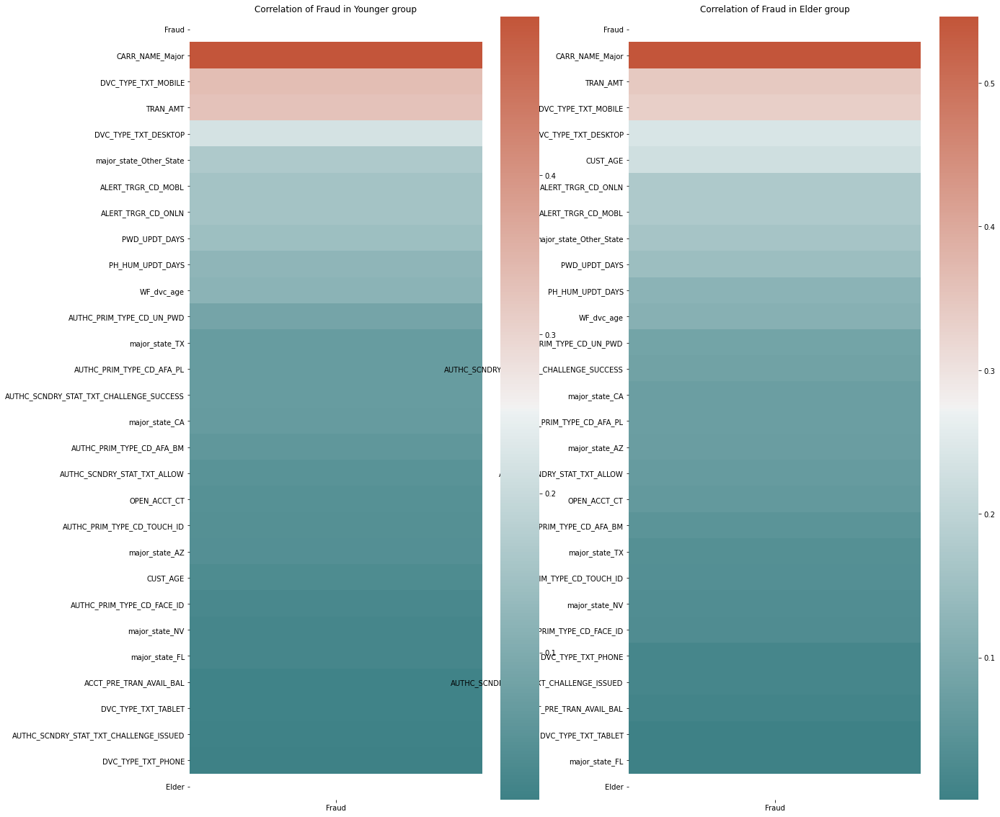

In [70]:
fig, axes = plt.subplots(1, 2, figsize=(20, 20), sharey=False,squeeze=False)
cmap = sns.diverging_palette(200, 20, as_cmap=True)
mask_younger = np.triu(np.ones_like(corr_younger[["Fraud"]], dtype=bool))
mask_elder = np.triu(np.ones_like(corr_elder[["Fraud"]], dtype=bool))

sns.heatmap(corr_younger[["Fraud"]].abs().sort_values(by=["Fraud"],ascending=False),mask = mask_younger,ax=axes[0][0],cmap= cmap).set(title = "Correlation of Fraud in Younger group")
sns.heatmap(corr_elder[["Fraud"]].abs().sort_values(by=["Fraud"],ascending=False),mask = mask_elder,ax=axes[0][1],cmap= cmap).set(title = "Correlation of Fraud in Elder group")

# PCA Analysis

I wanted to perform this analysis to firstly see if I could lower the dimensionality of
our data while still being able to explain most of the variance within the dataset. After performing the
PCA we first plotted a graph to show the proportion of variance explained by each component and also
the cumulative proportion of variance explained by the components in order to see if there was anything
peculiar or noteworthy with the components produced. I found that if the data was reduced to 24
components more than 95% of the variance would be explained as seen in the Total Variance explained
graph below.

In [5]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import plotly
import plotly.express as px
import plotly.io as pio
import kaleido

In [6]:
dataset = pd.read_csv("dataset_dummies.csv")

In [7]:
features = dataset.columns.to_list()
features.remove("Fraud")

In [8]:
#features = [feature for feature in features if feature not in ["CUST_STATE","PWD_UPDT_TS","PH_NUM_UPDT_TS","CUST_SINCE_DT","TRAN_TS","TRAN_DT","ACTVY_DT"]]
features = [feature for feature in features if feature not in ["CUST_STATE","ACTN_CD","ACTN_INTNL_TXT","TRAN_TYPE_CD","CARR_NAME","RGN_NAME","STATE_PRVNC_TXT","CUST_ZIP","PWD_UPDT_TS","PH_NUM_UPDT_TS","CUST_SINCE_DT","TRAN_TS","TRAN_DT","ACTVY_DT"]]

In [9]:
dataset_scalar = StandardScaler().fit_transform(dataset[features])
dataset_scalar = pd.DataFrame(dataset_scalar,columns=features)

In [11]:
pca = PCA()
components = pca.fit_transform(dataset_scalar)
labels = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca.explained_variance_ratio_ * 100)
}

fig = px.scatter_matrix(
    components,
    labels=labels,
    dimensions=range(5),
    color=dataset["Fraud"]
)
fig.update_traces(diagonal_visible=False)
fig.show()

In [12]:
pca = PCA()
components = pca.fit_transform(dataset_scalar)
labels = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca.explained_variance_ratio_ * 100)
}

fig = px.scatter_matrix(
    components,
    labels=labels,
    dimensions=range(5),
    color=dataset["Fraud"]
)
fig.update_traces(diagonal_visible=False)
fig.show()

In [13]:
exp_var_cumul = np.cumsum(pca.explained_variance_ratio_)

fig = px.area(
    x=range(1, exp_var_cumul.shape[0] + 1),
    y=exp_var_cumul,
    labels={"x": "# Components", "y": "Explained Variance"}
)
fig.show()

In [14]:
fig = px.scatter_matrix(
    components,
    labels=labels,
    dimensions=range(21,26),
    color=dataset["Fraud"]
)
fig.update_traces(diagonal_visible=False)
fig.show()

This analysis of all the components led us to
believe that the most suitable models should be more flexible such as decision trees or K nearest
neighbors as opposed to more stringent techniques like logistic regression.

# Train

Before we begin testing the various algorithms and their accuracy, we split the original elder dataset into
the testing and training dataset. To maintain the same proportion of fraudulent to non-fraudulent
transactions, we partitioned the training and testing sets accordingly. The training set will contain 85
percent of the observations --5880 observations --in the elder dataset, and the testing set the remaining 15
percent -- 1016 observations.

In [4]:
dataset = pd.read_csv("dataset_dummies.csv")

In [5]:
len(dataset)

13964

In [5]:
X_train, X_val, y_train, y_val = train_test_split(
    dataset.index.values,
    dataset["Fraud"].values,
    test_size = 0.15,
    random_state = 17,
    stratify = dataset["Fraud"].values
)

In [6]:
dataset["data_type"]=["not_set"] * dataset.shape[0]

dataset.loc[X_train,"data_type"] = "train"
dataset.loc[X_val,"data_type"] = "val"

dataset.groupby(["Fraud","data_type"]).count()

TRAN_AMT  ACCT_PRE_TRAN_AVAIL_BAL  CUST_AGE  OPEN_ACCT_CT  \
Fraud data_type                                                              
0     train          8330                     8330      8330          8330   
      val            1470                     1470      1470          1470   
1     train          3539                     3539      3539          3539   
      val             625                      625       625           625   

                 WF_dvc_age  PWD_UPDT_TS  CUST_ZIP  CUST_STATE  \
Fraud data_type                                                  
0     train            8330         8330      8330        8330   
      val              1470         1470      1470        1470   
1     train            3539         3539      3539        3539   
      val               625          625       625         625   

                 PH_NUM_UPDT_TS  CUST_SINCE_DT  ...  DVC_TYPE_TXT_DESKTOP  \
Fraud data_type                                 ...                         
0     train                8330           8330  ...                  8330   
      val                  1470           1470  ...                  1470   
1     train                3539           3539  ...                  3539   
      val                   625            625  ...                   625   

                 DVC_TYPE_TXT_MOBILE  DVC_TYPE_TXT_PHONE  DVC_TYPE_TXT_TABLET  \
Fraud data_type                                                                 
0     train                     8330                8330                 8330   
      val                       1470                1470                 1470   
1     train                     3539                3539                 3539   
      val                        625                 625                  625   

                 major_state_AZ  major_state_CA  major_state_FL  \
Fraud data_type                                                   
0     train                8330            8330            8330   
      val                  1470            1470            1470   
1     train                3539            3539            3539   
      val                   625             625             625   

                 major_state_NV  major_state_Other_State  major_state_TX  
Fraud data_type                                                           
0     train                8330                     8330            8330  
      val                  1470                     1470            1470  
1     train                3539                     3539            3539  
      val                   625                      625             625  

[4 rows x 41 columns]

In [7]:
features = dataset.columns.to_list()

features.remove("Fraud")

features = [feature for feature in features if feature not in ["data_type","CUST_STATE","ACTN_CD","ACTN_INTNL_TXT","TRAN_TYPE_CD","CARR_NAME","RGN_NAME","STATE_PRVNC_TXT","PWD_UPDT_TS","PH_NUM_UPDT_TS","CUST_ZIP","CUST_SINCE_DT","TRAN_TS","TRAN_DT","ACTVY_DT","Fraud"]]

In [8]:
dataset_elder = dataset[dataset["Elder"]==1]
features_elder = [feature for feature in features if feature not in ["Elder","data_type","CUST_STATE","ACTN_CD","ACTN_INTNL_TXT","TRAN_TYPE_CD","CARR_NAME","RGN_NAME","STATE_PRVNC_TXT","PWD_UPDT_TS","PH_NUM_UPDT_TS","CUST_SINCE_DT","TRAN_TS","TRAN_DT","ACTVY_DT"]]

train_X = dataset_elder[dataset_elder["data_type"]=="train"][features_elder]
train_Y = dataset_elder[dataset_elder["data_type"]=="train"]["Fraud"]
valid_X = dataset_elder[dataset_elder["data_type"]=="val"][features_elder]
valid_Y = dataset_elder[dataset_elder["data_type"]=="val"]["Fraud"]

In [9]:
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score 
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix
from sklearn import tree
import shap
from sklearn.model_selection import GridSearchCV
import os

# KNN

We first tried the k nearest neighbour algorithm to classify samples since it is simple to implement and
flexible to non-linear distribution problems. We picked F1 score for tuning parameters because we want to
achieve a balance between recall and precision of performance. When k equals 15, it looks stable on both
training set and test set, so we chose it as optimal value and got accuracy of 83.76%. Then we plot a
confusion matrix to see the error distribution. Both false positive errors and false negative errors look a
lot. In this project, we majorly focus on false negative problems because we tried to reduce as much risk
that senior customers suffer from fraud as possible. If the number of false negative samples is too large,
even if the accuracy of model prediction is higher enough, the risk that the model predicts non-fraud but
actually it is a fraud situation would exert a severe loss for related customers. Therefore, KNN may not be
a good choice for this problem. We have to try another method.

In [197]:
param_grid = {
    'n_neighbors' :[1,3,5,11,15,19],
    'weights':["uniform","distance"]
}
knn = KNeighborsClassifier()
# Instantiate the grid search model
gs = GridSearchCV(estimator = knn, param_grid = param_grid, 
                          cv = 3, n_jobs = -1, verbose = 2)
gs.fit(train_X,train_Y)

Fitting 3 folds for each of 12 candidates, totalling 36 fits


GridSearchCV(cv=3, estimator=KNeighborsClassifier(), n_jobs=-1,
             param_grid={'n_neighbors': [1, 3, 5, 11, 15, 19],
                         'weights': ['uniform', 'distance']},
             verbose=2)

In [198]:
gs.best_estimator_

KNeighborsClassifier(n_neighbors=15, weights='distance')

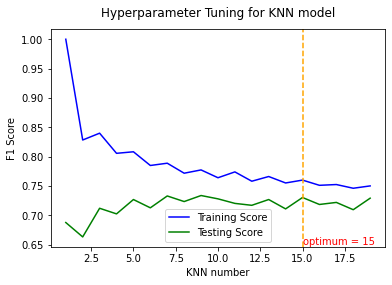

In [188]:
knnrange = range(1, 20)
testing_error = []
training_error = []
for knn_num in knnrange:
    model_1 = KNeighborsClassifier(n_neighbors=knn_num)
    model_1.fit(train_X, train_Y)
    training_error.append(f1_score(train_Y, model_1.predict(train_X)))
    testing_error.append(f1_score(valid_Y, model_1.predict(valid_X)))
plt.plot(knnrange, training_error, color='blue', label='Training Score')
plt.plot(knnrange, testing_error, color='green', label='Testing Score')
plt.xlabel('KNN number')
plt.axvline(x=15, color='orange', linestyle='--')
plt.annotate('optimum = 15', xy=(15, 0.65), color='red')
plt.ylabel('F1 Score')
plt.title('Hyperparameter Tuning for KNN model', fontsize = 12, y = 1.03)
plt.legend()

Text(0.5, 1.0, 'Confusion Matrix - KNN-15')

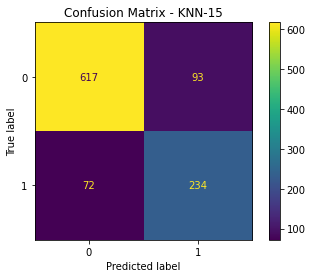

In [332]:
knn = KNeighborsClassifier(n_neighbors=15, weights='distance')
knn.fit(train_X,train_Y)
valid_Y_hat = knn.predict(valid_X)
plot_confusion_matrix(knn, valid_X, valid_Y)  
plt.title('Confusion Matrix - KNN-15')


In [333]:
#KNN-15 accuracy on valid set
accuracy_score(valid_Y,valid_Y_hat)

0.8375984251968503

In [377]:
feature_importance = dict(zip(features_elder,ada.feature_importances_))

In [269]:
feature_importance = dict(zip(features,dec_model.feature_importances_))

In [378]:
feature_importance_sorted  = sorted(feature_importance.items(),key = lambda kv: kv[1],reverse=True)[0:20]

# Decision Tree

The next model we decided to fit to the data was a decision tree model. However before we could produce
a tree and test its performance we had to decide what would be the optimal depth for the tree. To make
this decision we decided to look at the f1 scores for the different depths as this score would help in our
need to reduce the type 2 errors.To do this we plotted the f1 score against trees of varying depths as seen
in the tuning graph below and found that the optimal depth to be 8.

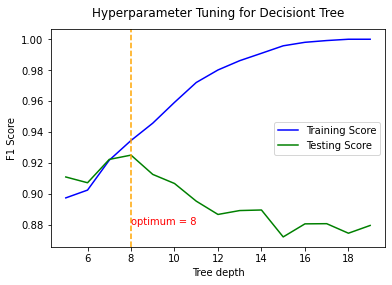

In [199]:
max_depths = range(5, 20)
testing_error = []
training_error = []
for max_depth in max_depths:
    model_1 = DecisionTreeClassifier(max_depth=max_depth)
    model_1.fit(train_X, train_Y)
    training_error.append(f1_score(train_Y, model_1.predict(train_X).astype(int)))
    testing_error.append(f1_score(valid_Y, model_1.predict(valid_X).astype(int)))

plt.plot(max_depths, training_error, color='blue', label='Training Score')
plt.plot(max_depths, testing_error, color='green', label='Testing Score')
plt.xlabel('Tree depth')
plt.axvline(x=8, color='orange', linestyle='--')
plt.annotate('optimum = 8', xy=(8, 0.88), color='red')
plt.ylabel('F1 Score')
plt.title('Hyperparameter Tuning for Decisiont Tree', fontsize = 12, y = 1.03)
plt.legend()

In [15]:
#Decision Tree Accuracy
dec_model = DecisionTreeClassifier(max_depth=8)
dec_model.fit(train_X, train_Y)
valid_Y_hat = dec_model.predict(valid_X)
accuracy = accuracy_score(valid_Y, valid_Y_hat)

accuracy

0.9537401574803149

The overall accuracy was seen to be 95.57% accurate on the testing set as opposed to the 83.76% found for the KNN
model.

This was a very good sign however we wanted to check the recall and precision of the model as well to determine how it performed in in its type 1 and type 2 error rates so we proceeded to plot a confusion matrix, as seen below, to compare the false negative predictions (type 2 errors) and the false positive predictions (type 1 errors). What we found is that both these error rates were reduced to < 2.5% with the type 2 error rate, which we are particularly hoping to minimize being 2.07%.

Text(0.5, 1.0, 'Confusion Matrix - Decision Tree')

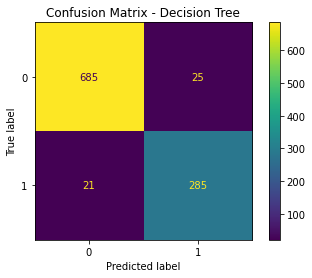

In [357]:
plot_confusion_matrix(dec_model, valid_X, valid_Y)  
plt.title('Confusion Matrix - Decision Tree')

In [33]:
text_representation = tree.export_text(dec_model)

After finding this depth we modeled the decision tree a visualisation of which can be seen below where
the blue nodes represent Fraudulent transactions and the Orange nodes represent Non-Fraudulent
transactions. Being a very large tree many of the labels on the nodes are unreadable without access to the
original file, however there were a few trends we saw in the tree that should be mentioned. Starting with
the root of the tree which uses the transaction amount feature and asks whether it is greater or less than
483 where if it was less it moved to the left and was less likely to be fraud and with the opposite being
seen on the branch to the right. This feature appeared many times throughout the tree and in general
followed the same trend that the higher the transaction amount the more likely the transaction was
fraudulent.


There were many other features such as the recency of password updates and authentication type that
were seen in the lower parts of the tree, however there seemed to be 2 other important features that
showed up multiple times the first being the pre transaction account balance which showed that higher
balances tended to mean that the transaction was more likely to be fraudulent which could show that
wealthier persons are targeted more frequently. And the 2nd was the age of the device used for the
transaction which showed that in general the younger the device the more likely it was to be fraud which
again makes sense seeing as the older population may be less up to date on their technology than the
criminal.

In [13]:
import graphviz

from graphviz import Source

In [16]:
dot_data = tree.export_graphviz(dec_model, out_file=None,
                                feature_names=features_elder,  
                                class_names=["NonFraud","Fraud"],
                                filled=True)

# Draw graph|
#graph=Source.from_file(current_path+"decision_tree.dot")
graph = graphviz.Source(dot_data,format="png")
#graph

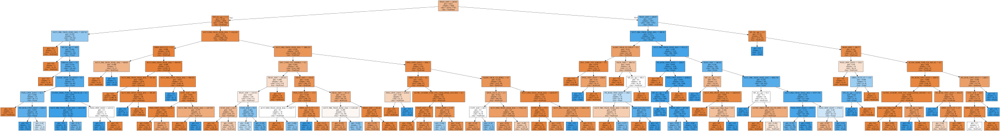

In [17]:
graph

# Random Forest

The random forests algorithm is built upon the decision tree method. Instead of one singular decision tree,
the random forests algorithm generates a large number of relatively uncorrelated trees (hence the forests
in the name). Then, each trees’ class prediction is tallied up, and then the class predictor value is then
decided through majority-vote. Since there are a large number of trees, the strength of the random forests
is that the errors of one individual tree can be overwritten by the other trees due to the wisdom of crowds.
Thus, random forests are less likely to make errors compared to a decision tree.

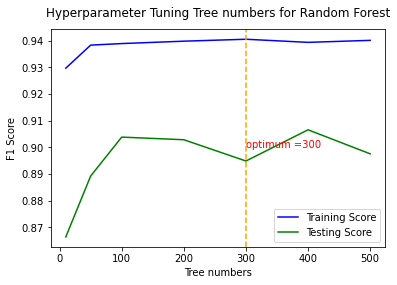

In [200]:
#max_depths = range(5, 20)
max_depths = [10,50, 100, 200, 300,400,500]
testing_error = []
training_error = []
for max_depth in max_depths:
    #model_1 = RandomForestClassifier(max_depth=max_depth, max_features=3, min_samples_leaf=3,
               #        min_samples_split=8, n_estimators=300)
    model_1 = RandomForestClassifier( max_depth=20, max_features=3, min_samples_leaf=3,
                       min_samples_split=8, n_estimators=max_depth)
    model_1.fit(train_X, train_Y)
    training_error.append(f1_score(train_Y, model_1.predict(train_X)))
    testing_error.append(f1_score(valid_Y, model_1.predict(valid_X)))
plt.plot(max_depths, training_error, color='blue', label='Training Score')
plt.plot(max_depths, testing_error, color='green', label='Testing Score')
plt.xlabel('Tree numbers')
plt.axvline(x=300, color='orange', linestyle='--')
plt.annotate('optimum =300', xy=(300, 0.9), color='red')
plt.ylabel('F1 Score')
plt.title('Hyperparameter Tuning Tree numbers for Random Forest', fontsize = 12, y = 1.03)
plt.legend()

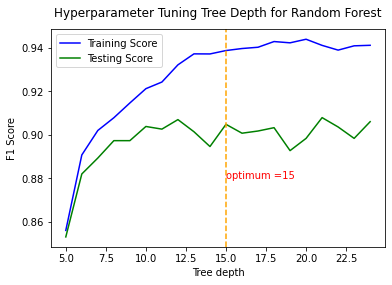

In [198]:
max_depths = range(5, 25)
testing_error = []
training_error = []
for max_depth in max_depths:
    model_1 = RandomForestClassifier(max_depth=max_depth, max_features=3, min_samples_leaf=3,
                       min_samples_split=8, n_estimators=300)
    model_1.fit(train_X, train_Y)
    training_error.append(f1_score(train_Y, model_1.predict(train_X)))
    testing_error.append(f1_score(valid_Y, model_1.predict(valid_X)))
plt.plot(max_depths, training_error, color='blue', label='Training Score')
plt.plot(max_depths, testing_error, color='green', label='Testing Score')
plt.xlabel('Tree depth')
plt.axvline(x=15, color='orange', linestyle='--')
plt.annotate('optimum =15', xy=(15,0.88), color='red')
plt.ylabel('F1 Score')
plt.title('Hyperparameter Tuning Tree Depth for Random Forest', fontsize = 12, y = 1.03)
plt.legend()

Text(0.5, 1.0, 'Confusion Matrix - Random Forest')

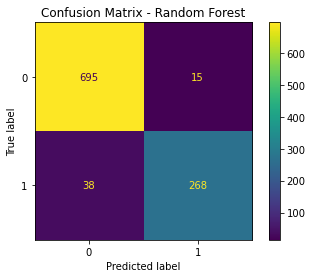

In [347]:
rfc = RandomForestClassifier(max_depth=20, max_features=3, min_samples_leaf=3,
                       min_samples_split=8, n_estimators=300)
rfc.fit(train_X,train_Y)
valid_Y_hat = rfc.predict(valid_X)
plot_confusion_matrix(rfc, valid_X, valid_Y)  
plt.title('Confusion Matrix - Random Forest')


In [348]:
#Random Forest Accuracy
accuracy_score(valid_Y,valid_Y_hat)


0.9478346456692913

We ran the algorithm and proceeded to test the accuracy of the model on our test set. The results are
shown above in the confusion matrix. Surprisingly, both overall accuracy fell and Type II error rate
increased, compared to the decision tree. Overall accuracy fell, from 95.47% to 94.78%, and Type II error
rate increased from 2.07% to 3.74%. Compared to the decision tree, the random forests algorithm is
suboptimal, especially because of the increase in Type II error, which was something we wanted to
minimize.

# AdaBoost Tree

Since random forest did not provide an improvement on the decision tree model we thought that we could
do some more analysis by attempting a boosted tree using the AdaBoost algorithm. Adaboost could
enable us to improve performance of a single decision tree by iteratively learning information from
misclassification samples. After tuning the hyperparameter, we pick 90 iterations as optimal value, and
successfully achieve higher accuracy(96.23%). However, the number of false negatives is larger than that
of the decision tree. Then we realized that since adaboost tree learnt both false negative and false positive
samples iteratively, therefore the optimal parameter may not be the best for our problem. So we decided to
tune the hyperparameter more specifically based on recall score and chose 450 iterations and 1.5 learning
rate. Finally we achieved 96.16% accuracy with 20 false negative errors on the test set.

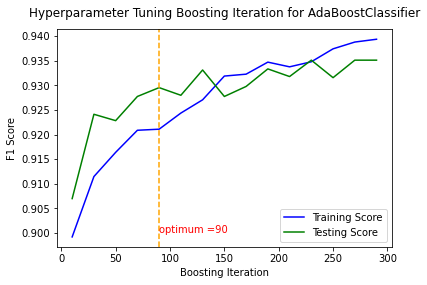

In [197]:
max_depths = range(10,300,20)
testing_error = []
training_error = []
for max_depth in max_depths:
    model_1 = AdaBoostClassifier(n_estimators=max_depth)
    model_1.fit(train_X, train_Y)
    training_error.append(f1_score(train_Y, model_1.predict(train_X)))
    testing_error.append(f1_score(valid_Y, model_1.predict(valid_X)))
plt.plot(max_depths, training_error, color='blue', label='Training Score')
plt.plot(max_depths, testing_error, color='green', label='Testing Score')
plt.xlabel('Boosting Iteration')
plt.axvline(x=90, color='orange', linestyle='--')
plt.annotate('optimum =90', xy=(90,0.9), color='red')
plt.ylabel('F1 Score')
plt.title('Hyperparameter Tuning Boosting Iteration for AdaBoostClassifier', fontsize = 12, y = 1.03)
plt.legend()

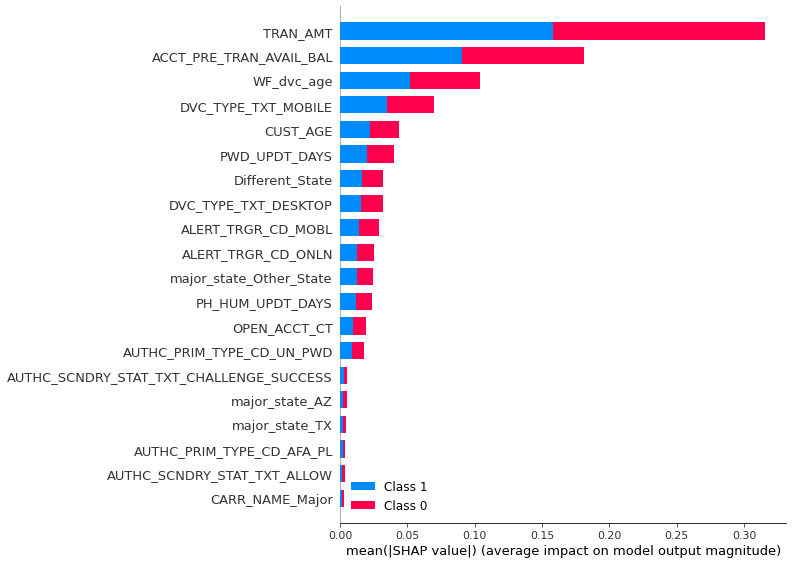

In [354]:
decexplainer = shap.TreeExplainer(rfc)

shap_values = decexplainer.shap_values(train_X)

shap.summary_plot(shap_values, train_X)

In [373]:
# Adaboost highest accuracy
ada  = AdaBoostClassifier(learning_rate=1, n_estimators=90)
ada.fit(train_X,train_Y)
valid_Y_hat = ada.predict(valid_X)
accuracy = accuracy_score(valid_Y, valid_Y_hat)
accuracy

0.9625984251968503

Text(0.5, 1.0, 'Confusion Matrix - AdaBoostClassifier')

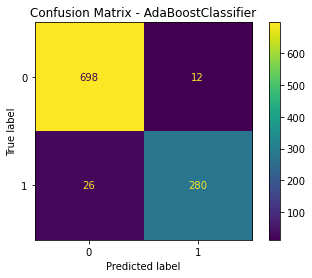

In [375]:
plot_confusion_matrix(ada, valid_X, valid_Y)  
plt.title('Confusion Matrix - AdaBoostClassifier')

The number of false negatives is larger than that of the decision tree since adaboost tree learnt both false negative and false positive samples iteratively, therefore the optimal parameter may not be the best for our problem.

So we decided to tune the hyperparameter more specifically based on recall score.

In [19]:
from sklearn.metrics import recall_score

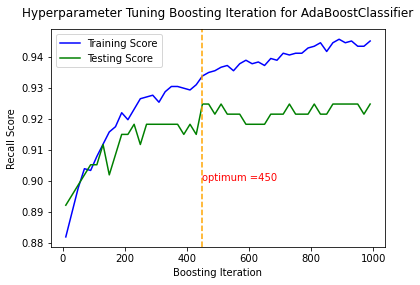

In [21]:
max_depths = range(10,1000,20)
testing_error = []
training_error = []
for max_depth in max_depths:
    model_1 = AdaBoostClassifier(n_estimators=max_depth)
    model_1.fit(train_X, train_Y)
    training_error.append(recall_score(train_Y, model_1.predict(train_X)))
    testing_error.append(recall_score(valid_Y, model_1.predict(valid_X)))
plt.plot(max_depths, training_error, color='blue', label='Training Score')
plt.plot(max_depths, testing_error, color='green', label='Testing Score')
plt.xlabel('Boosting Iteration')
plt.axvline(x=450, color='orange', linestyle='--')
plt.annotate('optimum =450', xy=(450,0.9), color='red')
plt.ylabel('Recall Score')
plt.title('Hyperparameter Tuning Boosting Iteration for AdaBoostClassifier', fontsize = 12, y = 1.03)
plt.legend()

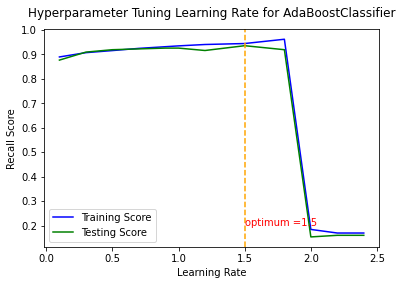

In [22]:
max_depths =[0.1,0.3,0.5,0.7,0.9,1,1.2,1.5,1.8,2,2.2,2.4]
testing_error = []
training_error = []
for max_depth in max_depths:
    model_1 = AdaBoostClassifier(n_estimators=450,learning_rate=max_depth)
    model_1.fit(train_X, train_Y)
    training_error.append(recall_score(train_Y, model_1.predict(train_X)))
    testing_error.append(recall_score(valid_Y, model_1.predict(valid_X)))
plt.plot(max_depths, training_error, color='blue', label='Training Score')
plt.plot(max_depths, testing_error, color='green', label='Testing Score')
plt.xlabel('Learning Rate')
plt.axvline(x=1.5, color='orange', linestyle='--')
plt.annotate('optimum =1.5', xy=(1.5,0.2), color='red')
plt.ylabel('Recall Score')
plt.title('Hyperparameter Tuning Learning Rate for AdaBoostClassifier', fontsize = 12, y = 1.03)
plt.legend()

In [23]:
# Adaboost updated accuracy
ada  = AdaBoostClassifier(learning_rate=1.5, n_estimators=450)
ada.fit(train_X,train_Y)
valid_Y_hat = ada.predict(valid_X)
accuracy = accuracy_score(valid_Y, valid_Y_hat)
accuracy

0.9616141732283464

Text(0.5, 1.0, 'Confusion Matrix - AdaBoostClassifier')

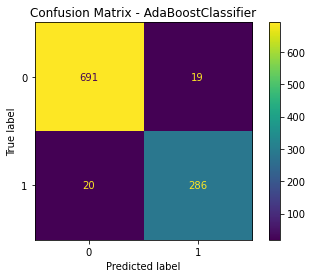

In [24]:
plot_confusion_matrix(ada, valid_X, valid_Y)  
plt.title('Confusion Matrix - AdaBoostClassifier')

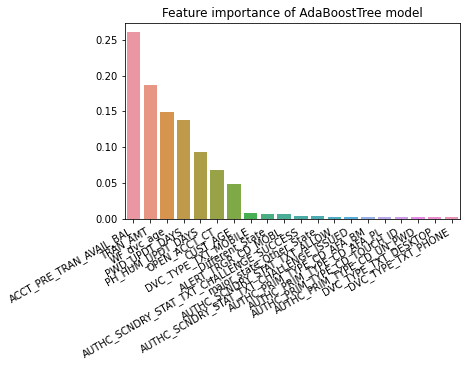

In [25]:
feature_importance = dict(zip(features_elder,ada.feature_importances_))
feature_importance_sorted  = sorted(feature_importance.items(),key = lambda kv: kv[1],reverse=True)[0:20]
key = []
value = []
for item in feature_importance_sorted:
    key.append(item[0])
    value.append(item[1])
fig,ax = plt.subplots()
sns.barplot(x=key,y=value,ax=ax).set(title = "Feature importance of AdaBoostTree model")
ax.set_xticklabels(key)
xtix = ax.get_xticks()
fig.autofmt_xdate()

Observing the result, we found that the features "Account Pre Transaction Available Balance","Transaction Amount","Wells Fargo Device Age", "Password Update Days" and "Phone Number Update Days" are most important for this classifier to detect fraud problems.

# Results and Discussion

Below is a summary table showing the overall accuracy of each of our models predictions against the testing set. As we can see the boosted tree with the AdaBoost algorithm is the most accurate at 96.23% followed closely by the Decision Tree and the Random Forests models with 95.47% and 94.78% accuracy respectively with the K nearest Neighbors model performing significantly worse than the other 3. This initial analysis of the results makes us believe that our AdaBoost model will most likely be the best to use when predicting fraudulent transactions.

| Model Type    | Accuracy |
| --- | --- |
| K Nearest Neighbors |  83.76% |
| Random Forests |  94.78% |
| Decision Tree |  95.47% |
| AdaBoost |  96.16% |

As stated before, this accuracy is a good baseline indicator for the performance of our models however when considering the real world implications of fraud classification the types of errors must be considered more closely in order to identify the best model for our purposes. Below is a table comparing the type 1 and type 2 error rates for each of the models. Again, we see that the AdaBoost model is the most accurate model, with the lowest Type 2 error rate of the four models presented. 

| Model Type    | Type 1 error: False Positives |  Type 2 error: False Negatives |
| --- | --- | --- |
| K Nearest Neighbors |  7.09% | 9.15% |
| Random Forests |  1.48% | 3.74% |
| Decision Tree |  2.46% | 2.07% |
| AdaBoost |  1.87% | 1.97% |

By running these four algorithms, and testing their accuracy on the testing set, we have concluded that the AdaBoost model is the most accurate model for detecting fraudulent transactions among the elder subset of consumers, due to their low Type 2 error rate (1.97%). Decision tree is a close second, with a Type 2 error rate slightly higher than the Type 2 error rate of the AdaBoost model (2.07%).